In [1]:
#Importing required libraries for EDA and Data Visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#Ignoring Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Setting figure parameters
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250

In [3]:
#Importing Datasets
data = pd.read_csv('wine.csv')

In [4]:
data

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,3,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,3,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,3,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


# EDA

In [5]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Type,178.0,1.938202,0.775035,1.00,1.0000,2.000,3.0000,3.00
Alcohol,178.0,13.000618,0.811827,11.03,12.3625,13.050,13.6775,14.83
Malic,178.0,2.336348,1.117146,0.74,1.6025,1.865,3.0825,5.80
Ash,178.0,2.366517,0.274344,1.36,2.2100,2.360,2.5575,3.23
Alcalinity,178.0,19.494944,3.339564,10.60,17.2000,19.500,21.5000,30.00
Magnesium,178.0,99.741573,14.282484,70.00,88.0000,98.000,107.0000,162.00
Phenols,178.0,2.295112,0.625851,0.98,1.7425,2.355,2.8000,3.88
Flavanoids,178.0,2.029270,0.998859,0.34,1.2050,2.135,2.8750,5.08
Nonflavanoids,178.0,0.361854,0.124453,0.13,0.2700,0.340,0.4375,0.66
Proanthocyanins,178.0,1.590899,0.572359,0.41,1.2500,1.555,1.9500,3.58


Looks no null values in the dataset

Outliers in Magnesium on Upper quartile and also few outlier points in color on upper quartile

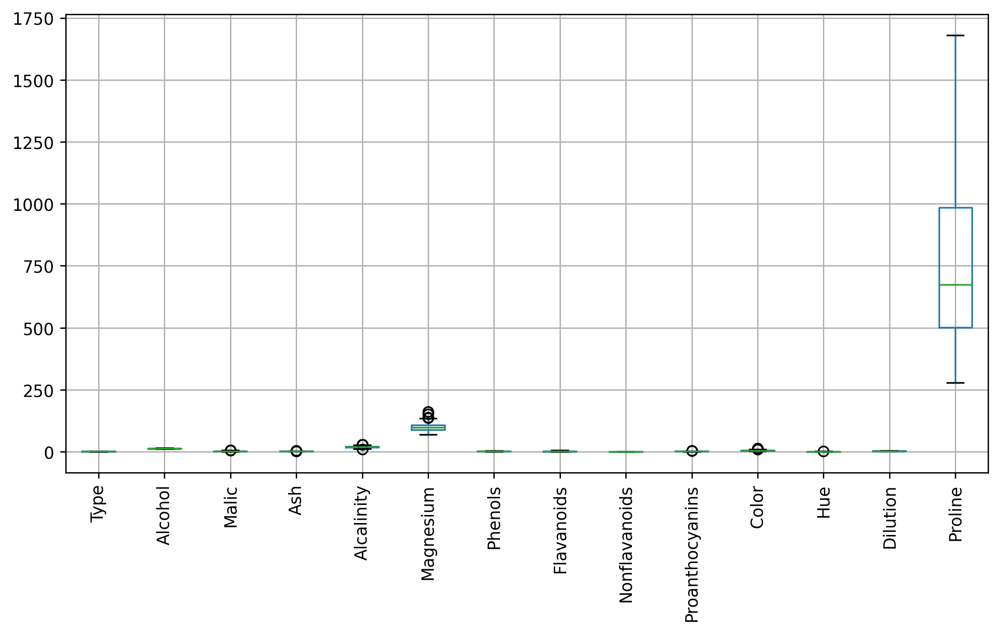

In [6]:
data.boxplot()
plt.xticks(rotation=90);

yes there are outliers in a few columns but this small amount of outliers wont affect the algorithm

In [7]:
data.isna().sum()

Type               0
Alcohol            0
Malic              0
Ash                0
Alcalinity         0
Magnesium          0
Phenols            0
Flavanoids         0
Nonflavanoids      0
Proanthocyanins    0
Color              0
Hue                0
Dilution           0
Proline            0
dtype: int64

In [8]:
#Checking for duplicated values
data.duplicated().sum()

0

In [9]:
data['Type'].unique()

array([1, 2, 3], dtype=int64)

In [10]:
len(data)

178

# Data Visualization

In [11]:
sns.pairplot(data)

<AxesSubplot:>

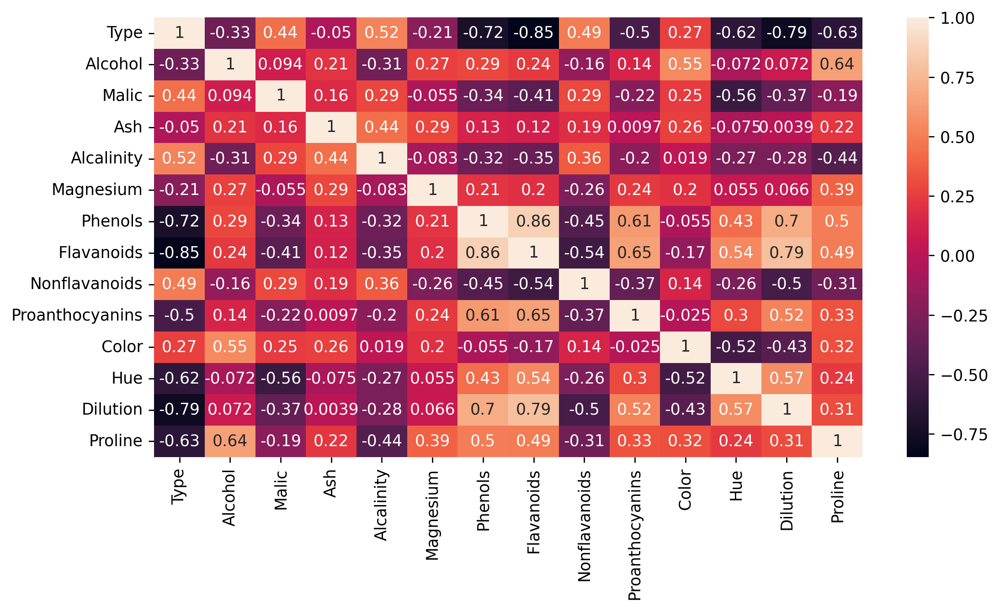

In [12]:
sns.heatmap(data.corr(), annot=True)

<AxesSubplot:xlabel='Flavanoids', ylabel='Phenols'>

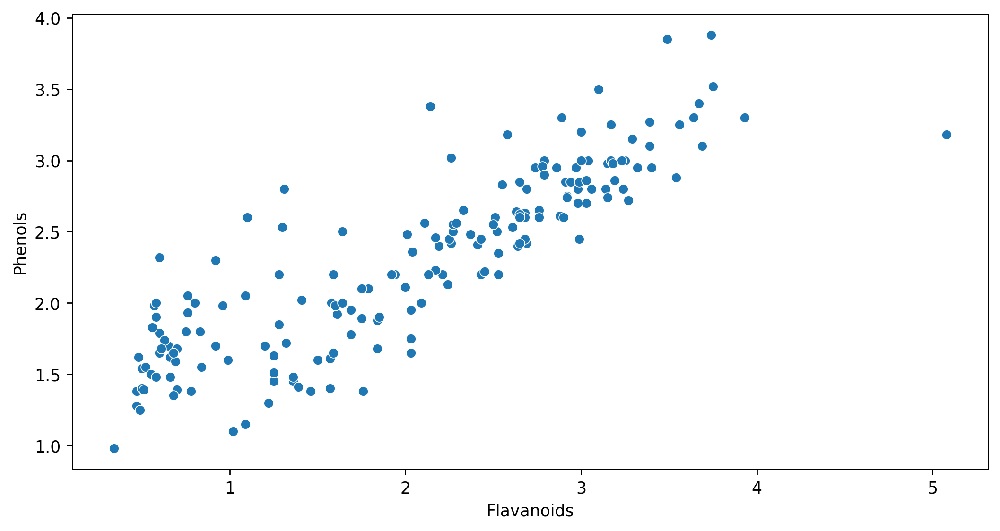

In [13]:
sns.scatterplot(data['Flavanoids'], data['Phenols'])

<AxesSubplot:xlabel='Flavanoids', ylabel='Dilution'>

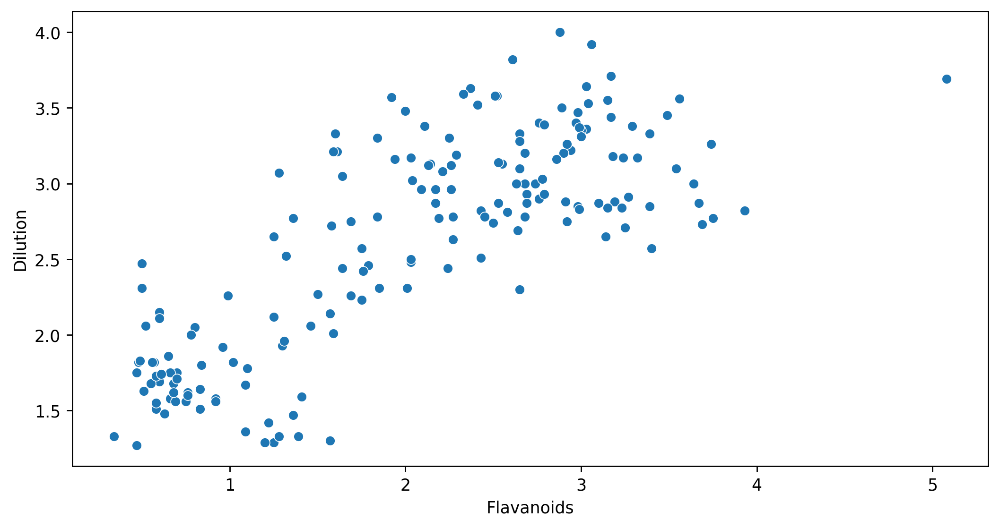

In [14]:
sns.scatterplot(data['Flavanoids'], data['Dilution'])

<AxesSubplot:xlabel='Flavanoids', ylabel='Proanthocyanins'>

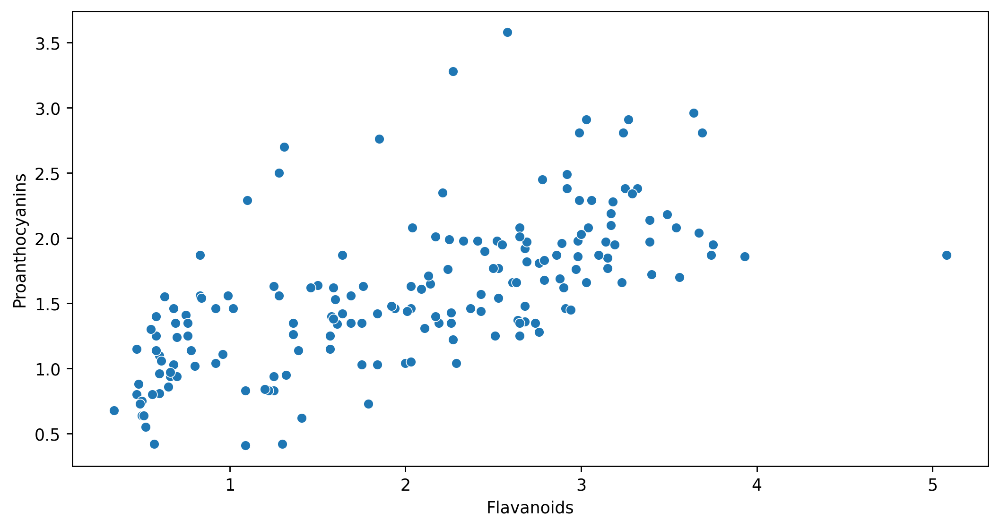

In [15]:
sns.scatterplot(data['Flavanoids'], data['Proanthocyanins'])

<AxesSubplot:xlabel='Flavanoids', ylabel='Nonflavanoids'>

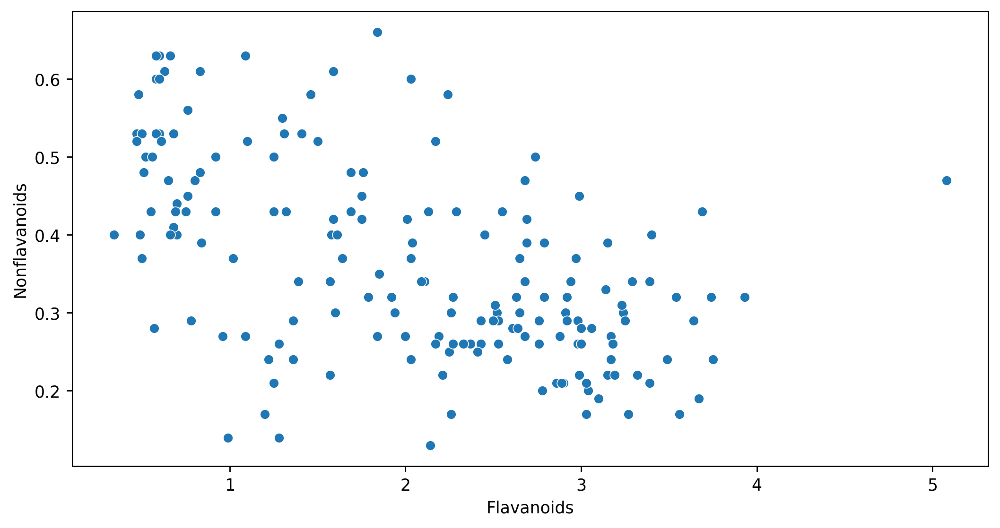

In [16]:
sns.scatterplot(data['Flavanoids'], data['Nonflavanoids'])

Flavonoids, Phenols, Dilutiion and Proline seems most important columns.

Let's verify using Principle Component Analysis

# PCA
For PCA we need to standardize the dataset

In [17]:
from sklearn.preprocessing import StandardScaler

In [18]:
sc = StandardScaler()
x = sc.fit_transform(data)

In [19]:
x

array([[-1.21394365,  1.51861254, -0.5622498 , ...,  0.36217728,
         1.84791957,  1.01300893],
       [-1.21394365,  0.24628963, -0.49941338, ...,  0.40605066,
         1.1134493 ,  0.96524152],
       [-1.21394365,  0.19687903,  0.02123125, ...,  0.31830389,
         0.78858745,  1.39514818],
       ...,
       [ 1.37386437,  0.33275817,  1.74474449, ..., -1.61212515,
        -1.48544548,  0.28057537],
       [ 1.37386437,  0.20923168,  0.22769377, ..., -1.56825176,
        -1.40069891,  0.29649784],
       [ 1.37386437,  1.39508604,  1.58316512, ..., -1.52437837,
        -1.42894777, -0.59516041]])

In [20]:
newdf = pd.DataFrame(x, columns= data.columns)

In [21]:
newdf

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,-1.213944,1.518613,-0.562250,0.232053,-1.169593,1.913905,0.808997,1.034819,-0.659563,1.224884,0.251717,0.362177,1.847920,1.013009
1,-1.213944,0.246290,-0.499413,-0.827996,-2.490847,0.018145,0.568648,0.733629,-0.820719,-0.544721,-0.293321,0.406051,1.113449,0.965242
2,-1.213944,0.196879,0.021231,1.109334,-0.268738,0.088358,0.808997,1.215533,-0.498407,2.135968,0.269020,0.318304,0.788587,1.395148
3,-1.213944,1.691550,-0.346811,0.487926,-0.809251,0.930918,2.491446,1.466525,-0.981875,1.032155,1.186068,-0.427544,1.184071,2.334574
4,-1.213944,0.295700,0.227694,1.840403,0.451946,1.281985,0.808997,0.663351,0.226796,0.401404,-0.319276,0.362177,0.449601,-0.037874
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,1.373864,0.876275,2.974543,0.305159,0.301803,-0.332922,-0.985614,-1.424900,1.274310,-0.930179,1.142811,-1.392758,-1.231206,-0.021952
174,1.373864,0.493343,1.412609,0.414820,1.052516,0.158572,-0.793334,-1.284344,0.549108,-0.316950,0.969783,-1.129518,-1.485445,0.009893
175,1.373864,0.332758,1.744744,-0.389355,0.151661,1.422412,-1.129824,-1.344582,0.549108,-0.422075,2.224236,-1.612125,-1.485445,0.280575
176,1.373864,0.209232,0.227694,0.012732,0.151661,1.422412,-1.033684,-1.354622,1.354888,-0.229346,1.834923,-1.568252,-1.400699,0.296498


In [22]:
import plotly.express as pe

<AxesSubplot:xlabel='Flavanoids', ylabel='Phenols'>

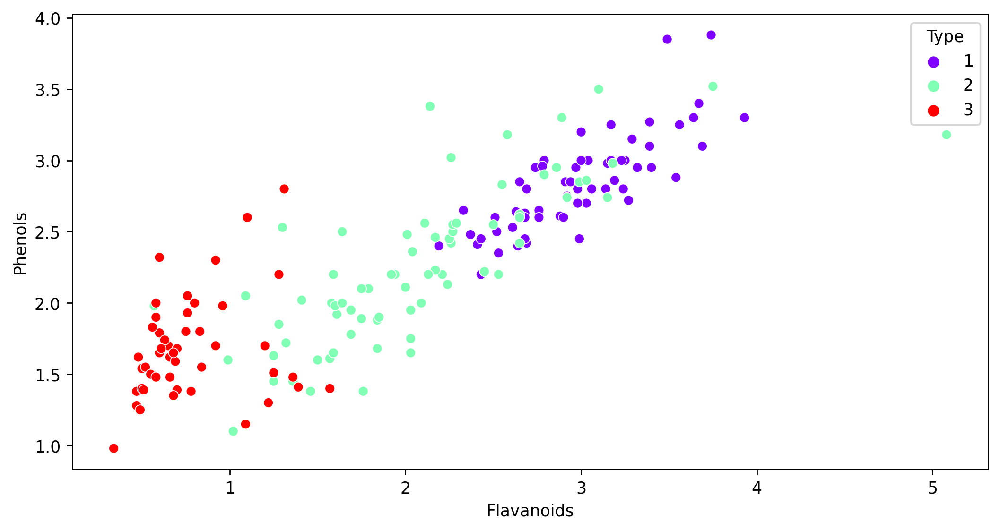

In [23]:
sns.scatterplot(data=data, x =data['Flavanoids'], y = data['Phenols'], hue=data['Type'], palette='rainbow')

It's difficult to interprete with dimensionality reduction therefore we do pca

In [24]:
#Importing PCA required libraries
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from bioinfokit.visuz import cluster

In [25]:
pca = PCA()
# pcs = pca.fit_transform(data)

In [26]:
pd.DataFrame(pca.fit_transform(x))

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,-3.522934,-1.453098,-0.164795,-0.013273,0.737345,-0.300716,0.573876,0.055637,-0.458765,1.065570,-0.420494,0.552928,-0.302978,0.200857
1,-2.528858,0.330019,-2.026707,-0.417144,-0.283214,-0.884309,-0.029716,1.010372,0.218806,-0.020182,-0.130020,0.394971,-0.146645,0.126402
2,-2.785029,-1.036936,0.983238,0.664232,-0.387565,0.468842,0.488305,-0.268957,1.222769,-0.106249,-0.279074,0.001898,0.021278,-0.055752
3,-3.922588,-2.768210,-0.174968,0.565088,-0.324360,0.262616,-0.398364,0.618844,-0.114658,0.107671,0.773866,-0.230929,-0.501277,0.019903
4,-1.407511,-0.867773,2.025829,-0.440906,0.227949,-0.593762,0.447876,0.434937,-0.261548,0.112434,-0.537931,-0.226686,0.274109,-0.517498
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3.627996,-2.206617,-0.343668,0.751705,-1.004109,-1.143155,0.843455,-0.206626,-0.125419,-0.392619,0.136783,0.174807,-0.198803,0.093951
174,2.942729,-1.752263,0.207480,0.399381,0.154223,-0.062465,0.139947,-0.565588,0.055341,-0.236267,0.254286,-0.277519,-0.185064,-0.024277
175,3.027272,-2.756040,-0.940803,0.607758,1.128136,0.005290,0.733026,0.052545,-0.027881,-0.212749,0.502640,0.693336,0.167036,-0.031696
176,2.755222,-2.293784,-0.550474,-0.391570,1.067083,1.012562,0.755423,0.426512,0.048784,0.479793,0.313786,0.344120,-0.109515,0.102823


In [27]:
pca.explained_variance_ratio_

array([0.39542486, 0.17836259, 0.10329102, 0.06627984, 0.06267875,
       0.0480556 , 0.03955707, 0.02500244, 0.02103871, 0.01873615,
       0.01613203, 0.01205691, 0.00925458, 0.00412945])

In [28]:
np.cumsum(pca.explained_variance_ratio_)

array([0.39542486, 0.57378745, 0.67707846, 0.74335831, 0.80603706,
       0.85409266, 0.89364973, 0.91865217, 0.93969088, 0.95842703,
       0.97455906, 0.98661596, 0.99587055, 1.        ])

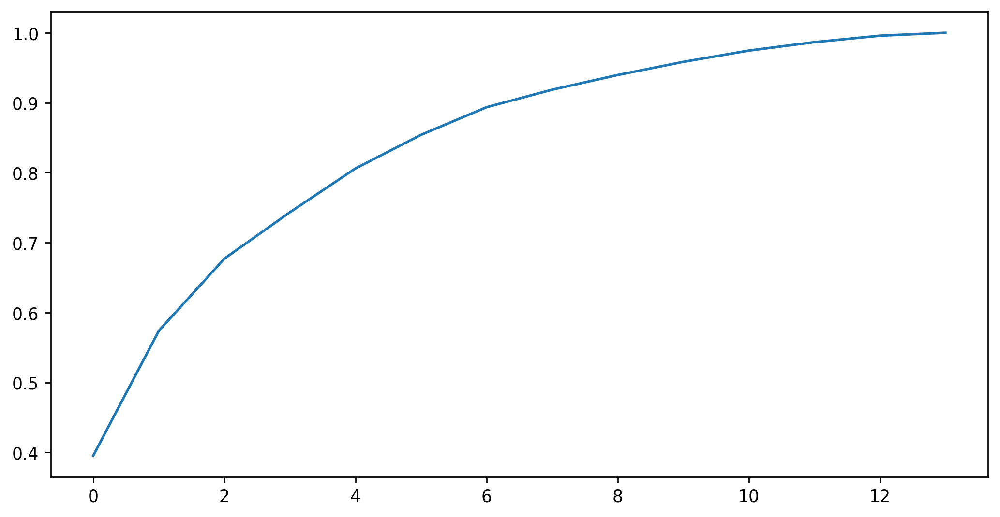

In [29]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))

In [30]:
pca = PCA(n_components=2)
pcs = pca.fit_transform(x)
pcs = pd.DataFrame(pcs, columns=['PC1', 'PC2'])
pcs

,PC1,PC2
0,-3.522934,-1.453098
1,-2.528858,0.330019
2,-2.785029,-1.036936
3,-3.922588,-2.768210
4,-1.407511,-0.867773
...,...,...
173,3.627996,-2.206617
174,2.942729,-1.752263
175,3.027272,-2.756040
176,2.755222,-2.293784


In [31]:
pe.scatter(x = pcs['PC1'], y = pcs['PC2'], color= data['Type'])

Now the whole data set is visualized and is also easily intrepretable

<AxesSubplot:>

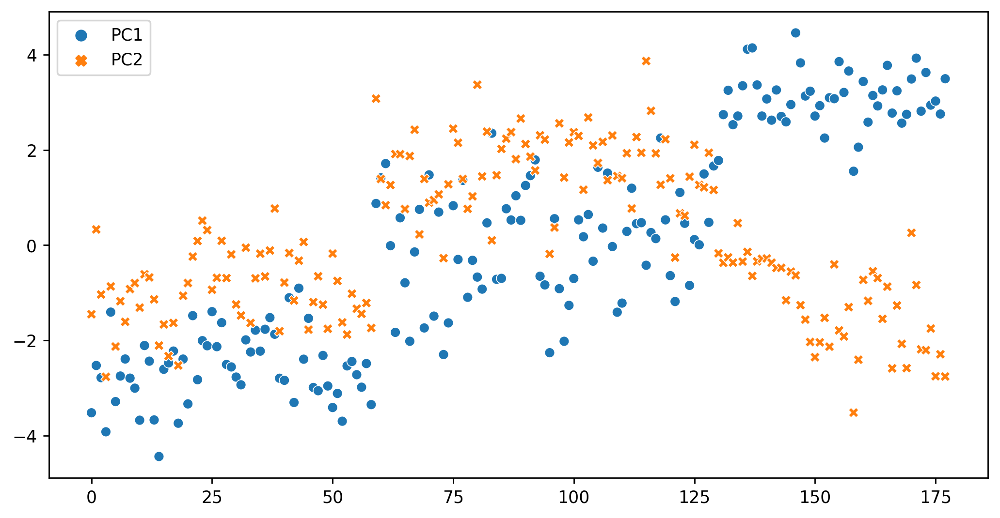

In [32]:
sns.scatterplot(data=pcs)

# Clustering Algorithms

# Hierarchical Clustering

In [33]:
from scipy.cluster import hierarchy
from sklearn.cluster import AgglomerativeClustering

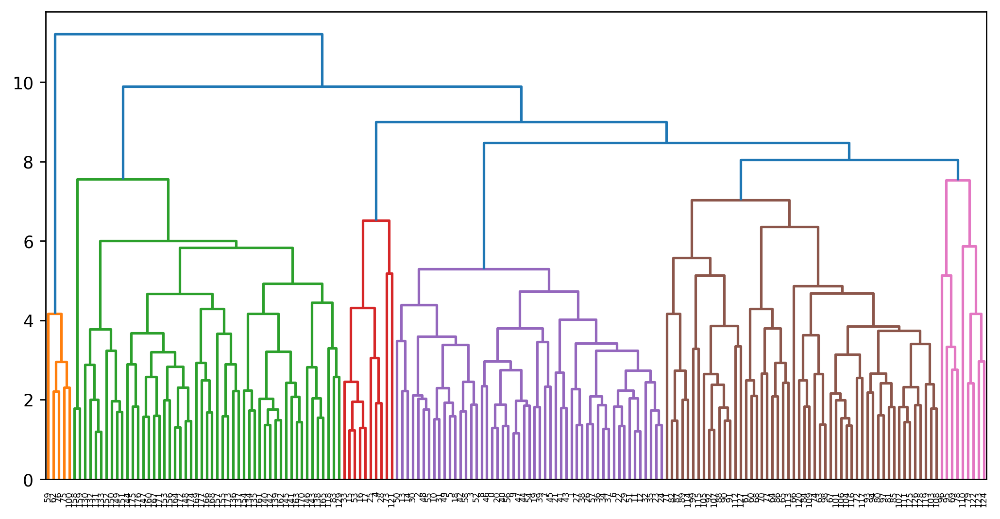

In [34]:
lk = hierarchy.linkage(newdf, method='complete')
dendrogram = hierarchy.dendrogram(lk)

In [35]:
hc = AgglomerativeClustering()
y = hc.fit_predict(newdf)

In [36]:
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1], dtype=int64)

In [37]:
newdf['Cluster'] = y

In [38]:
newdf

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Cluster
0,-1.213944,1.518613,-0.562250,0.232053,-1.169593,1.913905,0.808997,1.034819,-0.659563,1.224884,0.251717,0.362177,1.847920,1.013009,0
1,-1.213944,0.246290,-0.499413,-0.827996,-2.490847,0.018145,0.568648,0.733629,-0.820719,-0.544721,-0.293321,0.406051,1.113449,0.965242,0
2,-1.213944,0.196879,0.021231,1.109334,-0.268738,0.088358,0.808997,1.215533,-0.498407,2.135968,0.269020,0.318304,0.788587,1.395148,0
3,-1.213944,1.691550,-0.346811,0.487926,-0.809251,0.930918,2.491446,1.466525,-0.981875,1.032155,1.186068,-0.427544,1.184071,2.334574,0
4,-1.213944,0.295700,0.227694,1.840403,0.451946,1.281985,0.808997,0.663351,0.226796,0.401404,-0.319276,0.362177,0.449601,-0.037874,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,1.373864,0.876275,2.974543,0.305159,0.301803,-0.332922,-0.985614,-1.424900,1.274310,-0.930179,1.142811,-1.392758,-1.231206,-0.021952,1
174,1.373864,0.493343,1.412609,0.414820,1.052516,0.158572,-0.793334,-1.284344,0.549108,-0.316950,0.969783,-1.129518,-1.485445,0.009893,1
175,1.373864,0.332758,1.744744,-0.389355,0.151661,1.422412,-1.129824,-1.344582,0.549108,-0.422075,2.224236,-1.612125,-1.485445,0.280575,1
176,1.373864,0.209232,0.227694,0.012732,0.151661,1.422412,-1.033684,-1.354622,1.354888,-0.229346,1.834923,-1.568252,-1.400699,0.296498,1


In [39]:
newdf.groupby('Cluster').agg('mean')

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
Cluster,,,,,,,,,,,,,,
0,-0.507273,-0.069843,-0.330584,-0.095241,-0.213070,0.011124,0.364659,0.462558,-0.254813,0.282937,-0.373447,0.445064,0.484043,0.137567
1,1.373864,0.189159,0.895331,0.257945,0.577065,-0.030127,-0.987617,-1.252761,0.690119,-0.766287,1.011418,-1.205382,-1.310950,-0.372578


<AxesSubplot:xlabel='Flavanoids', ylabel='Proline'>

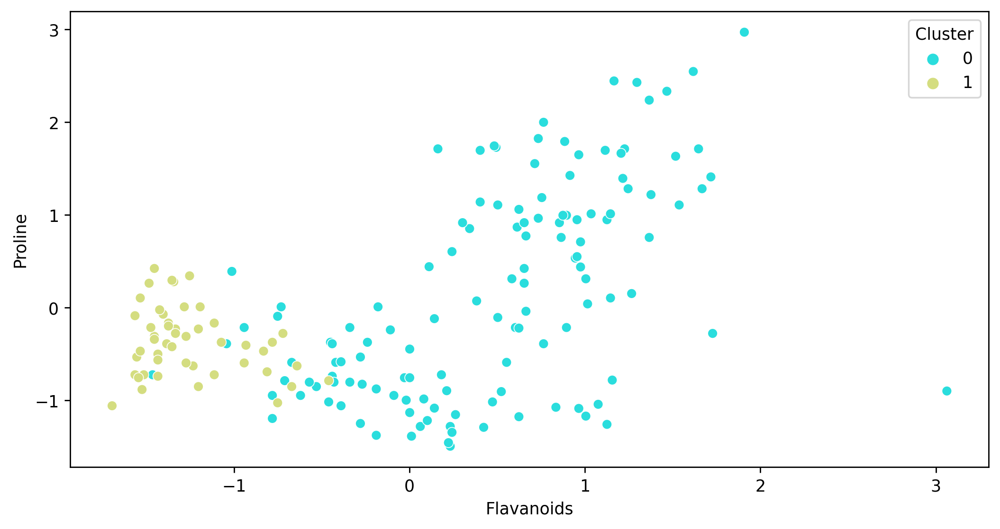

In [40]:
sns.scatterplot(newdf['Flavanoids'], newdf['Proline'], hue=newdf['Cluster'], palette='rainbow')

The hierarchy is prediction is close enough it predictied 2 clusters

Let us try giving input of 3 cluster and check the output of the hierarchical algorithm

In [41]:
hc = AgglomerativeClustering(n_clusters=3)
y = hc.fit_predict(newdf)

In [42]:
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 0, 2, 0, 2, 0, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1], dtype=int64)

<AxesSubplot:xlabel='Flavanoids', ylabel='Proline'>

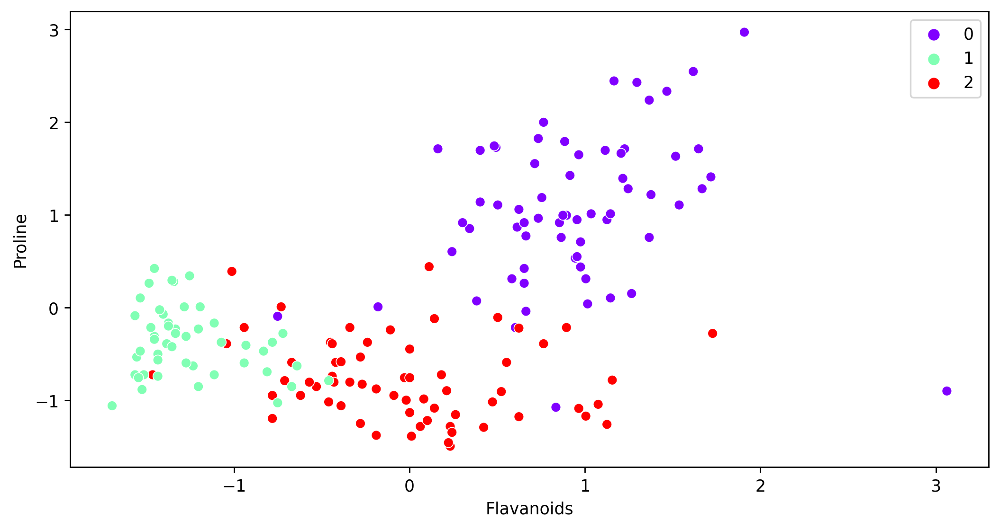

In [43]:
sns.scatterplot(newdf['Flavanoids'], newdf['Proline'], hue=y, palette='rainbow')

The prediction is good for 3 clusters in agglomerative clustering

# KMeans

In [44]:
from sklearn.cluster import KMeans

In [45]:
# Plotting elbow plot using wcss value to get the best number of clusters
# for KMeans algorithm
wcss = []
for i  in range(1,21):
    km = KMeans(n_clusters=i)
    km.fit_predict(newdf)
    wcss.append(km.inertia_)

In [46]:
wcss

[2527.0561797752807,
 1746.1605496992288,
 1286.5418505769387,
 1185.7705346124933,
 1119.3363405841924,
 1052.6550077037768,
 991.8369650209108,
 955.3536449181438,
 905.6572154558457,
 862.7447160288924,
 844.3856688434536,
 811.3627785676364,
 789.2896973061714,
 741.8638128374287,
 720.7894539015933,
 711.8648515014942,
 693.5308765066834,
 674.198661775487,
 655.4546266375883,
 638.1646137835326]

Text(0, 0.5, 'WCSS')

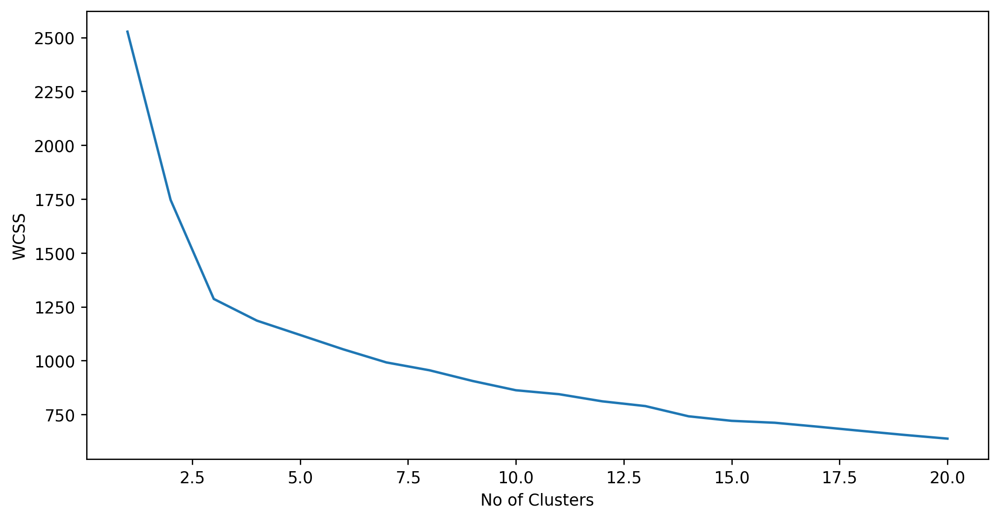

In [47]:
plt.plot(range(1,21), wcss)
plt.xlabel('No of Clusters')
plt.ylabel('WCSS')

Elbow Plot also says 3 clusters to dataset.

Threrfore we can conclude that 3 is the most optimal number of clusters for the dataset

In [48]:
km = KMeans(n_clusters=3)
y = km.fit_predict(newdf)
y

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1])

In [49]:
newdf['KM_Clusters'] = y
newdf

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Cluster,KM_Clusters
0,-1.213944,1.518613,-0.562250,0.232053,-1.169593,1.913905,0.808997,1.034819,-0.659563,1.224884,0.251717,0.362177,1.847920,1.013009,0,2
1,-1.213944,0.246290,-0.499413,-0.827996,-2.490847,0.018145,0.568648,0.733629,-0.820719,-0.544721,-0.293321,0.406051,1.113449,0.965242,0,2
2,-1.213944,0.196879,0.021231,1.109334,-0.268738,0.088358,0.808997,1.215533,-0.498407,2.135968,0.269020,0.318304,0.788587,1.395148,0,2
3,-1.213944,1.691550,-0.346811,0.487926,-0.809251,0.930918,2.491446,1.466525,-0.981875,1.032155,1.186068,-0.427544,1.184071,2.334574,0,2
4,-1.213944,0.295700,0.227694,1.840403,0.451946,1.281985,0.808997,0.663351,0.226796,0.401404,-0.319276,0.362177,0.449601,-0.037874,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,1.373864,0.876275,2.974543,0.305159,0.301803,-0.332922,-0.985614,-1.424900,1.274310,-0.930179,1.142811,-1.392758,-1.231206,-0.021952,1,1
174,1.373864,0.493343,1.412609,0.414820,1.052516,0.158572,-0.793334,-1.284344,0.549108,-0.316950,0.969783,-1.129518,-1.485445,0.009893,1,1
175,1.373864,0.332758,1.744744,-0.389355,0.151661,1.422412,-1.129824,-1.344582,0.549108,-0.422075,2.224236,-1.612125,-1.485445,0.280575,1,1
176,1.373864,0.209232,0.227694,0.012732,0.151661,1.422412,-1.033684,-1.354622,1.354888,-0.229346,1.834923,-1.568252,-1.400699,0.296498,1,1


In [50]:
newdf.groupby('KM_Clusters').agg('mean')

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Cluster
KM_Clusters,,,,,,,,,,,,,,,
0,0.079960,-0.922126,-0.378889,-0.465688,0.175507,-0.470251,-0.073934,0.044288,0.008761,0.018265,-0.862278,0.424503,0.249782,-0.765250,0.000000
1,1.347458,0.186543,0.904971,0.249210,0.583703,-0.050635,-0.988557,-1.236195,0.716842,-0.749608,0.988498,-1.191299,-1.301540,-0.380045,0.979592
2,-1.171521,0.878097,-0.304576,0.318942,-0.664524,0.564888,0.876505,0.943639,-0.585590,0.581783,0.167188,0.483728,0.767053,1.158347,0.000000


In [51]:
km.cluster_centers_

array([[ 7.99603601e-02, -9.22125705e-01, -3.78888900e-01,
        -4.65687533e-01,  1.75506952e-01, -4.70250716e-01,
        -7.39344159e-02,  4.42876728e-02,  8.76080038e-03,
         1.82648691e-02, -8.62278083e-01,  4.24503293e-01,
         2.49782063e-01, -7.65249842e-01, -1.11022302e-16],
       [ 1.34745816e+00,  1.86543138e-01,  9.04971453e-01,
         2.49210264e-01,  5.83703484e-01, -5.06353947e-02,
        -9.88556997e-01, -1.23619475e+00,  7.16841717e-01,
        -7.49607560e-01,  9.88498285e-01, -1.19129878e+00,
        -1.30153966e+00, -3.80044610e-01,  9.79591837e-01],
       [-1.17152057e+00,  8.78097281e-01, -3.04576328e-01,
         3.18941792e-01, -6.64523663e-01,  5.64888247e-01,
         8.76505462e-01,  9.43639030e-01, -5.85589813e-01,
         5.81782940e-01,  1.67188420e-01,  4.83728135e-01,
         7.67053491e-01,  1.15834713e+00, -2.22044605e-16]])

<AxesSubplot:xlabel='Flavanoids', ylabel='Proline'>

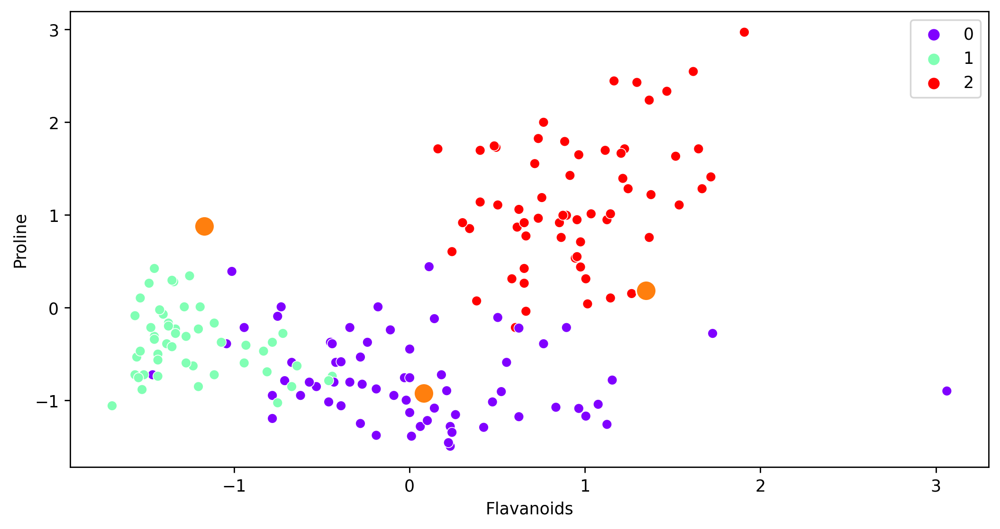

In [52]:
sns.scatterplot(newdf['Flavanoids'], newdf['Proline'], hue=newdf['KM_Clusters'], palette='rainbow')
sns.scatterplot(km.cluster_centers_[:,0], km.cluster_centers_[:,1], cmap = 'yellow', s=150)

In [53]:
from sklearn.metrics import silhouette_score

In [54]:
silhouette_score(newdf, y)

0.3452038738864972

In [55]:
wcss = []
for i  in range(1,21):
    km = KMeans(n_clusters=i)
    km.fit_predict(pcs)
    wcss.append(km.inertia_)

In [56]:
wcss

[1429.8783229293276,
 667.8521851848477,
 236.47750513064884,
 182.23894947897048,
 145.46489315050624,
 113.02126816600442,
 90.89610238365609,
 81.62630753902923,
 73.49626544115654,
 67.23846639756229,
 61.443518900711815,
 56.17235413107811,
 51.7973995994847,
 47.56766910831502,
 42.314455572105935,
 40.93741945654761,
 37.13129441243982,
 35.434238070568554,
 33.721409207291345,
 31.52475691879622]

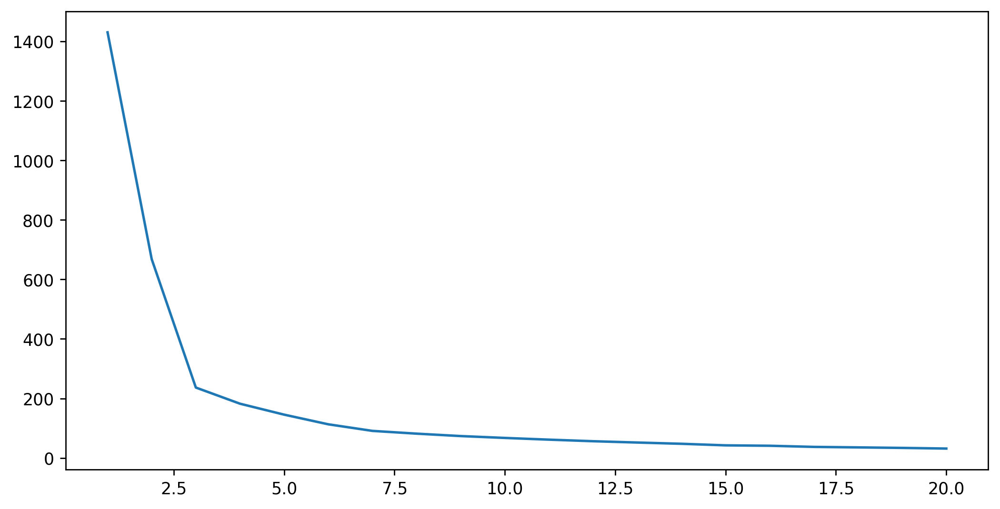

In [57]:
plt.plot(range(1,21), wcss)

# Clustering using PCA dataset

In [58]:
km = KMeans(n_clusters=3)
y = km.fit_predict(pcs)
y


array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1])

In [59]:
test = pcs

In [60]:
test

,PC1,PC2
0,-3.522934,-1.453098
1,-2.528858,0.330019
2,-2.785029,-1.036936
3,-3.922588,-2.768210
4,-1.407511,-0.867773
...,...,...
173,3.627996,-2.206617
174,2.942729,-1.752263
175,3.027272,-2.756040
176,2.755222,-2.293784


In [61]:
test['Cluster'] = y
test

,PC1,PC2,Cluster
0,-3.522934,-1.453098,2
1,-2.528858,0.330019,2
2,-2.785029,-1.036936,2
3,-3.922588,-2.768210,2
4,-1.407511,-0.867773,2
...,...,...,...
173,3.627996,-2.206617,1
174,2.942729,-1.752263,1
175,3.027272,-2.756040,1
176,2.755222,-2.293784,1


In [62]:
test.groupby('Cluster').agg('mean')

,PC1,PC2
Cluster,,
0,0.121711,1.750369
1,3.058665,-1.208263
2,-2.548859,-0.936610


<AxesSubplot:xlabel='PC1', ylabel='PC2'>

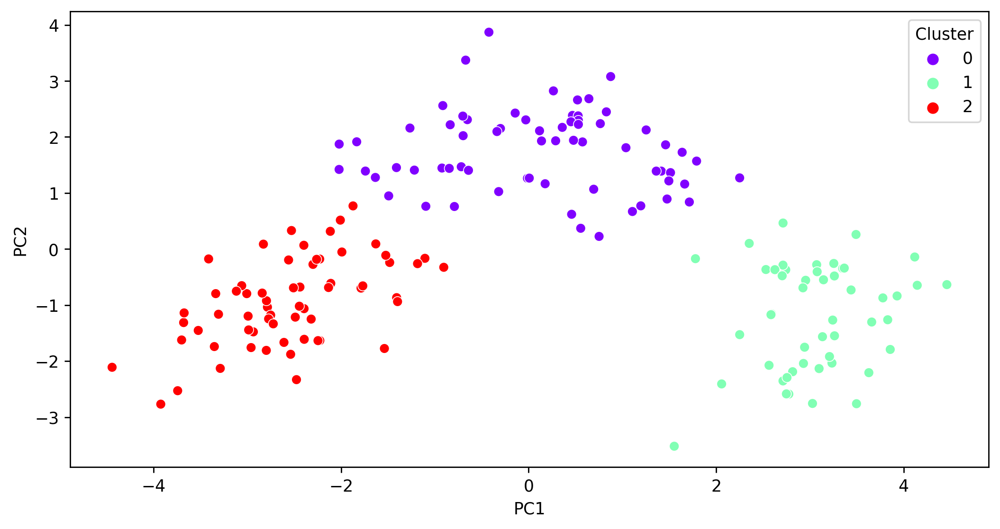

In [63]:
sns.scatterplot(test['PC1'], test['PC2'], hue=test['Cluster'], palette='rainbow')

The clustering is done perfectly after doing PCA hence PCA (Dimensionality Reduction) helps in getting better predictions

In [64]:
km.cluster_centers_

array([[ 0.12171142,  1.75036892],
       [ 3.05866503, -1.20826261],
       [-2.5488589 , -0.93661048]])

<AxesSubplot:xlabel='PC1', ylabel='PC2'>

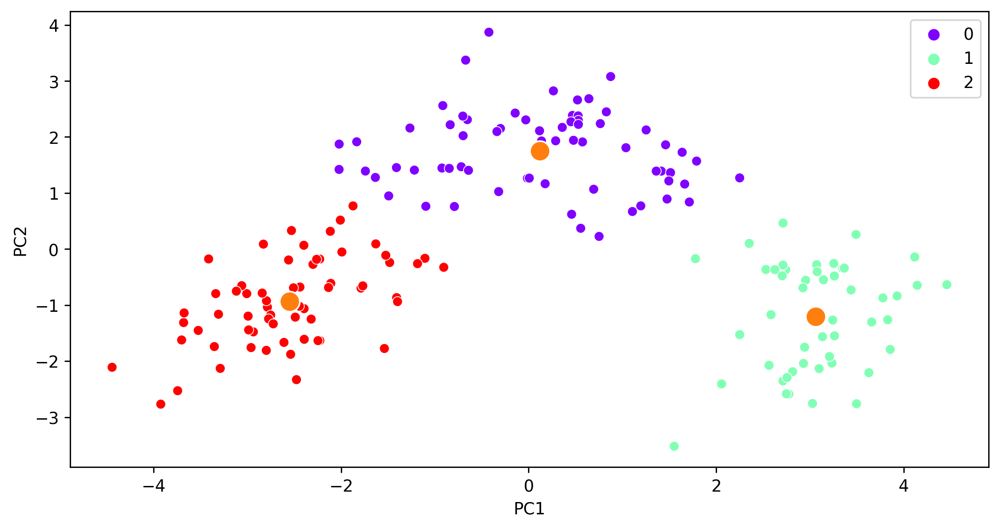

In [65]:
sns.scatterplot(test['PC1'], test['PC2'], hue=test['Cluster'], palette='rainbow')
sns.scatterplot(km.cluster_centers_[:,0], km.cluster_centers_[:,1], cmap='yellow', s=150)